<h1 align="center">Volume 2: The Fourier Transform.</h1>

    <Name> David Camacho    
    <Class>
    <Date>

<h2 align="center">Part 1: The Discrete Fourier Transform</h2>

In [403]:
from matplotlib import pyplot as plt
import numpy as np
from scipy.io import wavfile
from scipy.fftpack import fft, ifft
from scipy.fftpack import fft2, ifft2
from scipy import signal
import IPython

In [404]:
plt.rcParams["figure.dpi"] = 300             # Fix plot quality.
plt.rcParams["figure.figsize"] = (12,3)      # Change plot size / aspect (you may adjust this).

In [405]:
class SoundWave(object):
    """A class for working with digital audio signals."""

    # Problem 1.1
    def __init__(self, rate, samples):
        """Set the SoundWave class attributes.

        Parameters:
            rate (int): The sample rate of the sound.
            samples ((n,) ndarray): NumPy array of samples.
        """

        self.rate = rate
        self.samples = samples

    # Problems 1.1 and 1.7
    def plot(self, bool = False):

        NumSamples = len(self.samples)
        NumSeconds = NumSamples/(self.rate)
        x = np.linspace(0, NumSeconds, len(self.samples))

        if bool == True:
            plt.subplot(121)
            dft_num = fftpack.fft(self.samples)
            k = np.arange(len(dft_num)//2)
            freq = k*self.rate/len(self.samples)
            mag = np.abs(dft_num[:len(dft_num)//2])

            plt.xlim(xmin = 0, xmax = self.rate//4)
            plt.autoscale(enable=True, axis = 'y')
            plt.plot(freq,mag)
            plt.xlabel("Frequency (Hz)")
            plt.ylabel("Magnitude")
            plt.subplot(122)

        
        plt.ylim(ymin = -32768, ymax = 32767)
        plt.xlabel("Time (s)")
        plt.ylabel("Frequency (Hz)")
        plt.plot(x, self.samples)
        plt.tight_layout()
        plt.show()

        
        """Plot the graph of the sound wave (time versus amplitude)."""
        

    # Problem 1.2
    def export(self, filename, force=False):
        """Generate a wav file from the sample rate and samples. 
        If the array of samples is not of type np.int16, scale it before exporting.

        Parameters:
            filename (str): The name of the wav file to export the sound to.
        """


        if type(self.samples) != np.int16 or force == True:

            self.samples = np.int16((self.samples/max(self.samples))*32767)
       
        wavfile.write(filename, self.rate, self.samples)

    
    # Problem 1.4
    def __add__(self, other):
        """Combine the samples from two SoundWave objects.

        Parameters:
            other (SoundWave): An object containing the samples to add
                to the samples contained in this object.
        
        Returns:
            (SoundWave): A new SoundWave instance with the combined samples.

        Raises:
            ValueError: if the two sample arrays are not the same length.
        """
        
        if len(self.samples) != len(other.samples):
            raise ValueError("The arrays are not the same length")

        SumWave = self.samples + other.samples

        SumWaveObj = SoundWave(self.rate, SumWave)

        return SumWaveObj

    # Problem 1.4
    def __rshift__(self, other):
        """Concatentate the samples from two SoundWave objects.

        Parameters:
            other (SoundWave): An object containing the samples to concatenate
                to the samples contained in this object.

        Raises:
            ValueError: if the two sample rates are not equal.
        """

        if self.rate != other.rate:
            raise ValueError("The rates are not the same")

        Conc = np.concatenate((self.samples, other.samples))

        return SoundWave(self.rate, Conc)

        
    
    # Problem 2.1
    def __mul__(self, other):
        """Convolve the samples from two SoundWave objects using circular convolution.
        
        Parameters:
            other (SoundWave): An object containing the samples to convolve
                with the samples contained in this object.
        
        Returns:
            (SoundWave): A new SoundWave instance with the convolved samples.
        
    
        Raises:
            ValueError: if the two sample rates are not equal.
        """

        # Raise ValueError if the sample rates from A and B are not equal
        if (self.rate != other.rate):
            raise ValueError("Rates are not the same")

        # Find desired length of vectors
        length = max(len(self.samples), len(other.samples))

        # If self.samples is smaller, pad self.samples
        if len(self.samples) < length:
            new_self = np.pad(self.samples, (0, length-len(self.samples)))
            new_other = other.samples

        # Else if other.samples is smaller, pad other.samples
        elif len(other.samples) < length:
            new_other = np.pad(other.samples, (0, length - len(other.samples)))
            new_self = self.samples

        # If they are equal, basically do nothing
        else:
            new_self = self.samples
            new_other = other.samples

        # Compute convolution and return new SoundWave object
        convolution = ifft(fft(new_self) * fft(new_other)).real
        return SoundWave(self.rate, convolution)

    # Problem 2.2
    def __pow__(self, other):
        """Convolve the samples from two SoundWave objects using linear convolution.
        
        Parameters:
            other (SoundWave): An object containing the samples to convolve
                with the samples contained in this object.
        
        Returns:
            (SoundWave): A new SoundWave instance with the convolved samples.

        Raises:
            ValueError: if the two sample rates are not equal.
        """
        
        # Raise Value Error if the sample rates from A and B are not equal
        if(self.rate != other.rate):
            raise ValueError("Rates are not the same")

        # Find Needed Length and Smallest Power

        NeededLength = len(self.samples) + len(other.samples) - 1
        SmallestPower = 1
        while SmallestPower < NeededLength: SmallestPower *=2

        # Replace self and othe
        new_self = np.pad(self.samples, (0,SmallestPower - len(self.samples)))
        new_other = np.pad(other.samples, (0, SmallestPower - len(other.samples)))

        # Compute convolution and return SoundWave object
        convolution2 = ifft(fft(new_self) * fft(new_other)).real
        return SoundWave(self.rate, convolution2)


    # Problem 2.4
    def clean(self, low_freq, high_freq):
        """Remove a range of frequencies from the samples using the DFT. 

        Parameters:
            low_freq (float): Lower bound of the frequency range to zero out.
            high_freq (float): Higher boound of the frequency range to zero out.
        """

        # Find DFT
        DFTNeeded = fft(self.samples)

        # Find required indices
        LowIndex = round((low_freq * len(self.samples))/(self.rate))
        HighIndex = round((high_freq * len(self.samples))/(self.rate))

        # Zero out needed entries
        DFTNeeded[LowIndex: HighIndex] = 0
        DFTNeeded[len(self.samples) - HighIndex : len(self.samples) - LowIndex] = 0

        # Make cleaned signal and return array
        CleanedSignal = ifft(DFTNeeded)
        CleanedSignalArray = np.array(CleanedSignal)
        return CleanedSignalArray
       


### Problem 1.1

- Implement `SoundWave.__init__()`.
- Implement `SoundWave.plot()`.
- Use the `scipy.io.wavfile.read()` and the `SoundWave` class to plot `tada.wav`.

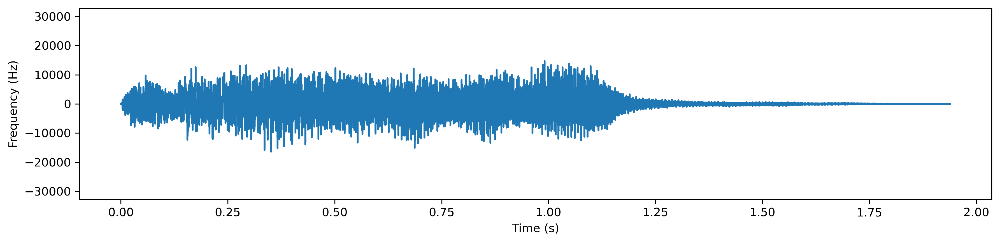

In [406]:
Rate, Samples = wavfile.read("tada.wav")
SW1 = SoundWave(Rate, Samples)

SW1.plot()

### Problem 1.2

- Implement `SoundWave.export()`.
- Use the `export()` method to create two new files containing the same sound as `tada.wav`: one without scaling, and one with scaling (use `force=True`).
- Use `IPython.display.Audio()` to embed the original and new versions of `tada.wav` in the notebook.

In [407]:
SW2 = SoundWave(Rate, Samples)
SW2.export("Duplicatetada.wav", force = False)
SW2.export("Scaledtada.wav", force = True)
IPython.display.Audio(filename = "tada.wav")




In [408]:
IPython.display.Audio(filename = "Duplicatetada.wav")

In [409]:
IPython.display.Audio(filename = "Scaledtada.wav")

### Problem 1.3

- Implement `generate_note()`.
- Use `generate_note()` to create an A tone that lasts for two seconds. Embed it in the notebook.

In [410]:
def generate_note(frequency, duration):
    """Generate an instance of the SoundWave class corresponding to 
    the desired soundwave. Uses sample rate of 44100 Hz.
    
    Parameters:
        frequency (float): The frequency of the desired sound.
        duration (float): The length of the desired sound in seconds.
    
    Returns:
        sound (SoundWave): An instance of the SoundWave class.
    """
   
    NumSamples = 44100 * duration

    SampleArguments = np.linspace(0, duration, int(NumSamples))

    SampleValues = np.sin(2*np.pi*SampleArguments*frequency)

    return SoundWave(44100, SampleValues)


In [411]:
SoundA = generate_note(440, 2)
SoundA.export("A.wav", force = True)
IPython.display.Audio(filename = "A.wav")


### Problem 1.4

- Implement `SoundWave.__add__()`.
- Generate a three-second A minor chord (A, C, and E) and embed it in the notebook.
- Implement `SoundWave.__rshift__()`.
- Generate the arpeggio A$\,\rightarrow\,$C$\,\rightarrow\,$E, where each tone lasts one second, and embed it in the notebook.

In [412]:
ASound = generate_note(440., 2.)
CSound = generate_note(523.25, 2.)
ESound = generate_note(659.25, 2.)

ACE = ASound + CSound + ESound

ACE.export("ACE.wav", force = True)
IPython.display.Audio(filename = "ACE.wav")

In [413]:
ACEArpeg = ASound >> CSound >> ESound

ACEArpeg.export("ACEArpeg.wav", force = True)
IPython.display.Audio(filename = "ACEArpeg.wav")


### Problem 1.5

- Implement `simple_dft()` with the formula $c=F_nf$, where $F_n$ is the n-dimensional DFT matrix.
- Use `np.allclose()` to check that `simple_dft()` and `scipy.fftpack.fft()` give the same result (after scaling).

In [414]:
def simple_dft(samples):
    """Compute the DFT of an array of samples.

    Parameters:
        samples ((n,) ndarray): an array of samples.
    
    Returns:
        ((n,) ndarray): The DFT of the given array.
    """

    n = len(samples)
    m = np.arange(n).reshape(n,1)
    W = np.exp((-2j * np.pi/n) * m @ m.T)
    return W @ samples/n





    


In [415]:
n = 100
RandomArray = np.random.randint(-100, 100, size = n)
print(np.allclose(n* simple_dft(RandomArray), fftpack.fft(RandomArray)))

True


### Problem 1.6

- Implement `simple_fft()`.
- Generate an array of $8192$ random samples and take its DFT using `simple_dft()`, `simple_fft()`, and `scipy.fftpack.fft()`.
Print the runtimes of each computation.
- Use `np.allclose()` to check that `simple_fft()` and `scipy.fftpack.fft()` give the same result (after scaling).

In [416]:
def simple_fft(samples, threshold=1):
    """Compute the DFT using the FFT algorithm.
    
    Parameters:
        samples ((n,) ndarray): an array of samples.
        threshold (int): when a subarray of samples has fewer
            elements than this integer, use simple_dft() to
            compute the DFT of that subarray.
    
    Returns:
        ((n,) ndarray): The DFT of the given array.
    """
    
    def split(g):

        n = len(g)

        if n <= threshold:
            return simple_dft(g)
        
        else:
            even = split(g[::2])
            odd = split(g[1::2])
            z = np.zeros(n, dtype = complex)
            for k in range(0, n):
                z[k] = np.exp(-2j*np.pi*k/n)
            
            m = n//2

            return np.concatenate((even + np.multiply(z[:m], odd), even + np.multiply(z[m:], odd)))

    return split(samples)/np.size(samples)

In [417]:
RandomArray2 = np.random.randint(-100, 1000, size =8192)

%time simple_dft(RandomArray2)
%time simple_fft(RandomArray2)
%time fftpack.fft(RandomArray2)

CPU times: user 2.21 s, sys: 546 ms, total: 2.76 s
Wall time: 2.34 s
CPU times: user 980 ms, sys: 30 ms, total: 1.01 s
Wall time: 329 ms
CPU times: user 274 µs, sys: 51 µs, total: 325 µs
Wall time: 261 µs


array([3698921.            -0.j        ,    6692.5915332 +10516.29729675j,
         24982.0896616 -23137.63015781j, ...,
        -46715.11528496 +4271.17742912j,   24982.0896616 +23137.63015781j,
          6692.5915332 -10516.29729675j])

### Problem 1.7

- Modify `SoundWave.plot()` so that it accepts a boolean. When the boolean is `True`, take the DFT of the stored samples and plot (in a new subplot) the frequencies present on the $x$-axis and the magnituds of those frequences on the $y$-axis. Only the display the first half of the plot, and adjust the $x$-axis so that it correctly shows the frequencies in Hertz.
- Display the plot of the DFT of an A tone.
- Display the plot of the DFT of an A minor chord.

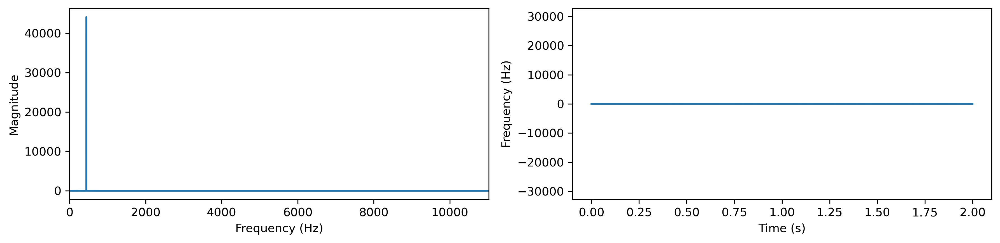

In [418]:
ASound.plot(bool = True)

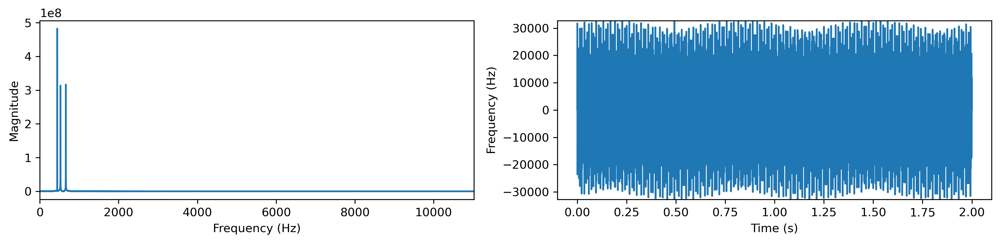

In [419]:
ACE.plot(bool = True)

### Problem 1.8

Use the DFT to determine the individual notes that are present in `mystery_chord.wav`.

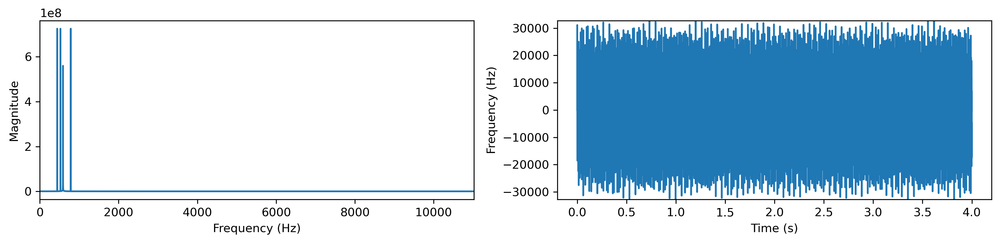

Hertz: [587.5, 523.25, 784.0, 440.0]
These correspond to notes D,C,G,A


In [420]:
rate, samples = wavfile.read("mystery_chord.wav")

mysteryChord = SoundWave(rate, samples)

mysteryChord.plot(bool = True)

fft_samples = fftpack.fft(samples)

mystery = np.abs(fft_samples[:len(fft_samples)//2])

freq = np.argsort(mystery)[-4:]

N = len(samples)

hertz = [rate * k/N for k in range(0,N)]

notes = []

for i in freq:
    notes.append(hertz[i])

print(f"Hertz: {notes}")
print(f"These correspond to notes D,C,G,A")




The notes are...

<h2 align="center">Part 2: Convolution and Filtering.</h2>

### Problem 2.1

- Implement `SoundWave.__mul__()` for circular convolution.
- Generate 2 seconds of white noise at the same sample rate as `tada.wav`.
- Compute the circular convolution of `tada.wav` and the white noise. Embed the result in the notebook.
- Append the circular convolution to itself and embed the result in the notebook.

In [421]:
# White Noise SoundWave Object
rate = 22050 # Create 2 seconds of white noise at a given rate.
white_noise = np.random.randint(-32767, 32767, rate*2, dtype=np.int16)
WhiteNoiseFile = SoundWave(rate, white_noise)


# Tada Wave Soundwave Object
Tada_Rate, Tada_Samples = wavfile.read("tada.wav")
TadaFile = SoundWave(Tada_Rate, Tada_Samples)

# Make Convolution
ConvolutionTada = TadaFile * WhiteNoiseFile

# Make Signal
NewSignal = ConvolutionTada >> ConvolutionTada

# Display Audio Signal
NewSignal.export("Conv.wav", force = True)
IPython.display.Audio(filename = "Conv.wav")






### Problem 2.2

- Implement `SoundWave.__pow__()` for linear convolution.
- Time the linear convolution of `CGC.wav` and `GCG.wav` using `SoundWave.__pow__()` and `scipy.signal.fftconvolve()`.
- Embed the two original sounds and their convolutions in the notebook. Check that the convolutions with `SoundWave.__pow__()` and `scipy.signal.fftconvolve()` sound the same.

In [422]:
# Read audio files
CGC_Rate, CGC_Samples = wavfile.read("CGC.wav")
GCG_Rate, GCG_Samples = wavfile.read("GCG.wav")

# Create SoundWave objects
CGCFile = SoundWave(CGC_Rate,CGC_Samples)
GCGFile = SoundWave(GCG_Rate, GCG_Samples)


#Time for SoundWave.__pow__()
%time conv = CGCFile ** GCGFile

# Display audio
conv.export("Conv2.wav", force = True)
IPython.display.Audio(filename = "Conv2.wav")

CPU times: user 47.7 ms, sys: 5.46 ms, total: 53.2 ms
Wall time: 53.4 ms


In [423]:
# Time for scipy.signal.fftconvolve()
%time conv2 = signal.fftconvolve(CGC_Samples, GCG_Samples)

# Create Covolve Object and display audio
ConvolveObject = SoundWave(CGC_Rate, conv2)
ConvolveObject.export("Conv3.wav", force = True)
IPython.display.Audio(filename = "Conv3.wav")


CPU times: user 18.4 ms, sys: 5.4 ms, total: 23.8 ms
Wall time: 22.4 ms


### Problem 2.3

Use `SoundWave.__pow__()` or `scipy.signal.fftconvolve()` to compute the linear convolution of `chopin.wav` and `balloon.wav`.
Embed the two original sounds and their convolution in the notebook.

In [424]:
# Read in Chopin and Balloon
Chopin_Rate, Chopin_Samples = wavfile.read("chopin.wav")
Balloon_Rate, Balloon_Samples = wavfile.read("balloon.wav")

# Create SoundWave objects of Chopin and Balloon
ChopinFile = SoundWave(CGC_Rate,CGC_Samples)
BalloonFile = SoundWave(GCG_Rate, GCG_Samples)

In [425]:
# Display Chopin audio
IPython.display.Audio(filename = "chopin.wav")

In [426]:
# Display Balloon audio
IPython.display.Audio(filename = "balloon.wav")

In [427]:
# Find Convolution of Chopin and Balloon
Conv4 = signal.fftconvolve(Chopin_Samples, Balloon_Samples)
ConvolveObject2 = SoundWave(CGC_Rate, Conv4)

# Display audio
ConvolveObject2.export("Conv4.wav", force = True)
IPython.display.Audio(filename = "Conv4.wav")

### Problem 2.4

- Implement `SoundWave.clean()`.
- Clean `noisy1.wav` by filtering out frequencies from $1250$-$2600$ Hz. Embed the original and the cleaned versions in the notebook.
- Clean `noisy2.wav`. Embed the original and the cleaned versions in the notebook.

In [428]:
# Read in files
Noisy1_Rate, Noisy1_Samples = wavfile.read("noisy1.wav")
Noisy2_Rate, Noisy2_Samples = wavfile.read("noisy2.wav")

# Create SoundWaves
Noisy1File = SoundWave(Noisy1_Rate, Noisy1_Samples)
Noisy2File = SoundWave(Noisy2_Rate, Noisy2_Samples)

In [429]:
# Display Audio
IPython.display.Audio(filename = "noisy1.wav")


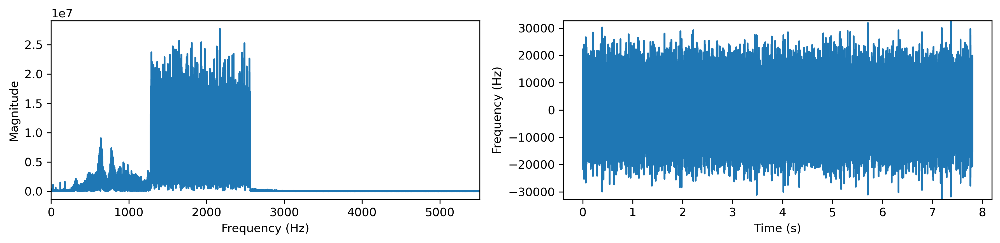

/var/folders/td/8px6smg12fxf4nw_rf4snx840000gn/T/ipykernel_71003/1805724824.py:61: ComplexWarning: Casting complex values to real discards the imaginary part
  self.samples = np.int16((self.samples/max(self.samples))*32767)


In [430]:
# Display Plot
Noisy1File.plot(bool = True)

# Display Cleaned Audio
Cleaned1 = Noisy1File.clean(1250, 2600)
Cleaned1File = SoundWave(Noisy1_Rate, Cleaned1)
Cleaned1File.export("1.wav", force = True)
IPython.display.Audio(filename = "1.wav")


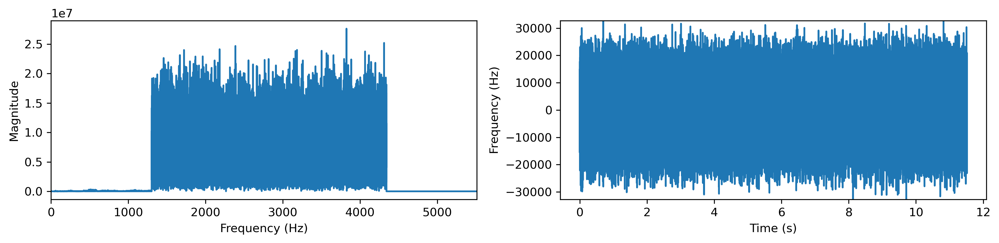

/var/folders/td/8px6smg12fxf4nw_rf4snx840000gn/T/ipykernel_71003/1805724824.py:61: ComplexWarning: Casting complex values to real discards the imaginary part
  self.samples = np.int16((self.samples/max(self.samples))*32767)


In [431]:
# Display Plot
Noisy2File.plot(bool = True)

# Display Cleaned Audio
Cleaned2 = Noisy2File.clean(1300, 4400)
Cleaned2File = SoundWave(Noisy2_Rate, Cleaned2)
Cleaned2File.export("1.wav", force = True)
IPython.display.Audio(filename = "1.wav")

### Problem 2.5

- Clean `vuvuzela.wav` by filtering bad frequencies out of the left and right channels individually.
- Recombine the left and right channels and embed the result in the notebook.

In [432]:
# Read in audio and separate the channels
rate, samples = wavfile.read("vuvuzela.wav")
ch1 = SoundWave(rate, samples[:, 0])
ch2 = SoundWave(rate, samples[:, 1])

# Clean and display Channel 1
cleanedCh1 = ch1.clean(200, 500)
cleanedCh1File = SoundWave(rate, cleanedCh1)
cleanedCh1File.export("ch1.wav", force = True)
IPython.display.Audio(filename = "ch1.wav")

/var/folders/td/8px6smg12fxf4nw_rf4snx840000gn/T/ipykernel_71003/1805724824.py:61: ComplexWarning: Casting complex values to real discards the imaginary part
  self.samples = np.int16((self.samples/max(self.samples))*32767)


In [433]:
# Clean and display Channel 2
cleanedCh2 = ch2.clean(200, 500)
cleanedCh2File = SoundWave(rate, cleanedCh2)
cleanedCh2File.export("ch2.wav", force = True)
IPython.display.Audio(filename = "ch2.wav")

/var/folders/td/8px6smg12fxf4nw_rf4snx840000gn/T/ipykernel_71003/1805724824.py:61: ComplexWarning: Casting complex values to real discards the imaginary part
  self.samples = np.int16((self.samples/max(self.samples))*32767)


### Problem 2.6

- Clean up `license_plate.png` so that the year printed on the sticker in the bottom right corner of the plate is legible.
- Display the original and cleaned images.

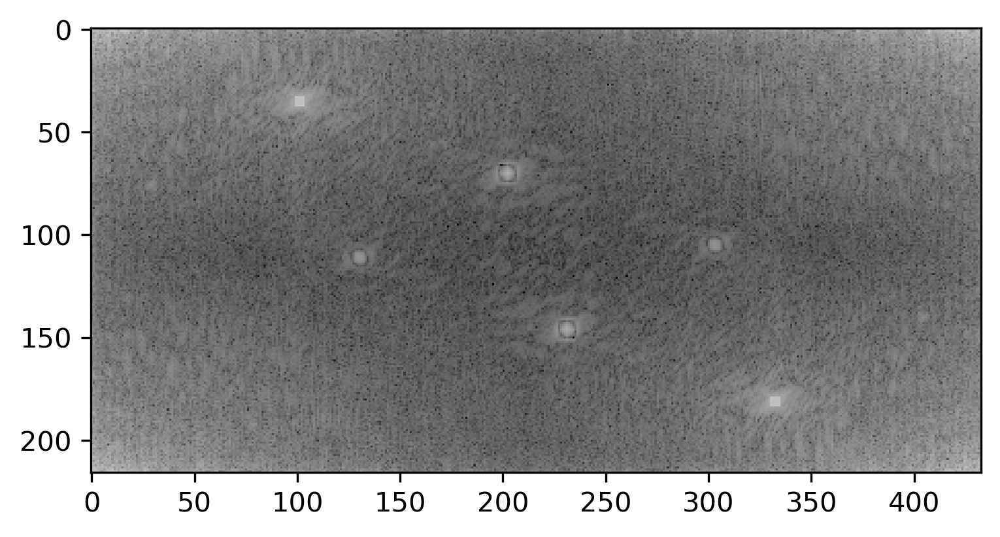

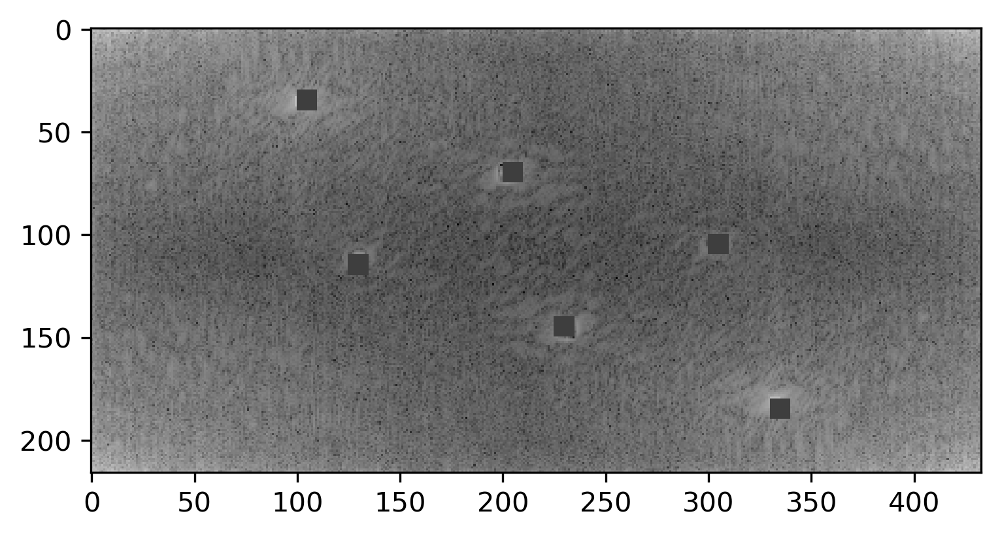

In [442]:
# Read the image
import imageio
image = imageio.imread("license_plate.png")

# Plot the log magnitude of the image's DFT
im_dft = fft2(image)
meandft = np.mean(im_dft)
plt.imshow(np.log(np.abs(im_dft)), cmap = "gray")
plt.show()

# Clean up the image
im_dft[30:40, 100:110] = meandft
im_dft[110:120, 125:135] = meandft
im_dft[65:75, 200:210] = meandft
im_dft[140:150, 225:235] = meandft
im_dft[100:110, 300:310] = meandft
im_dft[180:190, 330:340] = meandft

# Show cleaned up image
plt.imshow(np.log(np.abs(im_dft)), cmap = "gray")
plt.show()

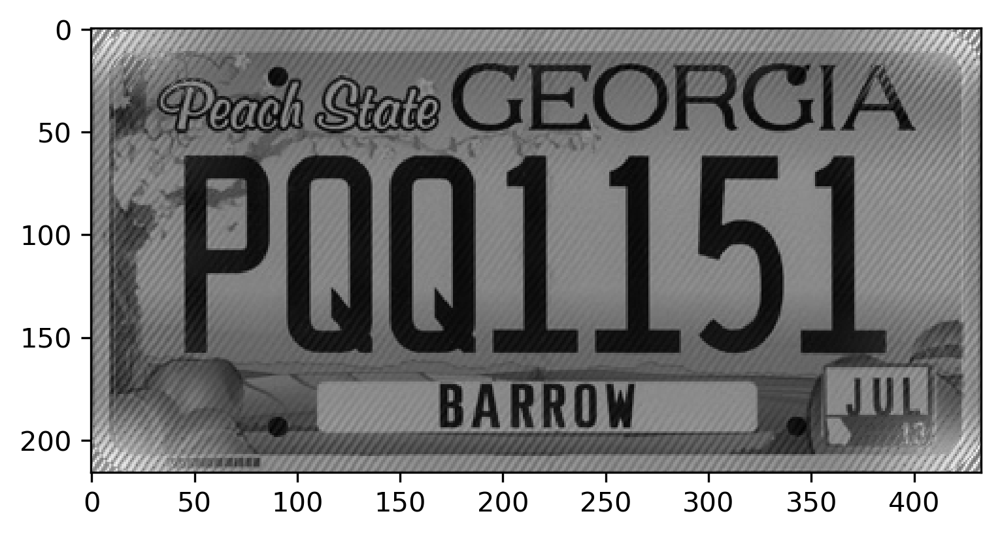

In [443]:
NeededIfft = ifft2(im_dft).real
plt.imshow(NeededIfft, cmap = "gray")
plt.show()

The year on the sticker is...

2013